In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from __future__ import print_function
import numpy as np
from tqdm import tqdm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib import cm
plt.rcParams.update({'font.size': 14, 'lines.markersize' : 4})

from scipy.optimize import curve_fit
import sys, os
import time, datetime
from datetime import timedelta
import pandas as pd
sys.path.append('/reg/d/psdm/tmo/tmox51020/results/paris/recon')
from recon_funcs import *
import h5py

/reg/neh/home/tdd14/modules/CPBASEX/pbasex-Python/pbasex/gData.py:55: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if gData['rBF'] is not 'custom':


Hi! I imported. 


In [27]:
! cp /reg/d/psdm/tmo/tmox51020/results/paris/recon/recon_funcs.py .

In [3]:
from matplotlib import cm
from matplotlib.colors import ListedColormap
my_cmap = cm.get_cmap('jet')
xr = np.linspace(0, 1, 2000)
my_cmap = my_cmap(xr)
my_cmap[0][-1] = 0
my_cmap = ListedColormap(my_cmap)

In [233]:
def make_MM(x0):
    xshift, yshift =  x0[8], x0[9] 

    # Coordinates that you want to Perspective Transform
    pts1 = np.float32([[0,0],\
                       [0,1024],\
                       [1024,0],\
                       [1024, 1024]])


    # Size of the Transformed Image
    pts2 = np.float32([[0+xshift-x0[0],0 + yshift-x0[1]],\
                       [0+xshift-x0[2],1024 + yshift-x0[3]],\
                       [1024+xshift-x0[4],0 + yshift-x0[5]],\
                       [1024+xshift-x0[6],1024 + yshift-x0[7]]])

    MM = cv2.getPerspectiveTransform(pts1,pts2)
    return MM

X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.zeros((1024,1024))
maskhm[(rs>120) & (rs<420)]=1
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhmb=np.zeros((1024,1024))
maskhmb[(rs>120) & (rs<450)]=1
nmask = np.reshape(rebin(rebin(maskhm,4),4),[64**2,])


x,y, = 530,512
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-x)**2+(Y-y)**2)
mask=np.zeros((1024,1024))
mask[rs>1*48]=1
x,y, = 530,512

nmask = np.reshape(rebin(rebin(maskhm,4),4),[64**2,]) #rebin later
nnmask = (rebin(np.reshape(nmask, [64,64]))).flatten()
nnmask = rebin(rebin(maskhm,4),4)
#nnmask = (rebin(np.reshape(nmask, [64,64])*(inbg))).flatten()
nnmask[nnmask<0.5] = 0
nnmask[nnmask>=0.5] = 1

maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>120) & (rs<270)]=1

fanmask = np.ones((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
fanmask [(16*46.5<X) &(X<16*58) & (32*16<Y) & (Y<42*16)]=0

In [5]:
def make_quads(x0):
    quads=np.ones((1024,1024))
    quads[:512,:512]= x0[0]
    quads[:512,512:]= x0[1]
    quads[512:,:512]= x0[2]
    quads[512:,512:]= x0[3]
    return quads


In [151]:
PR = PolarRebin('/reg/d/psdm/tmo/tmox51020/results/paris/recon/PR_c32_r32_th32.h5') 

In [227]:
runnum = 131
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])

mfn = 25 
gfn = 15 


tt = np.array([4410506985168791867, 4410506988730542491, 4410506988738931102,
       4410506989255748184, 4410506989347498617, 4410506997788011795,
       4410506997821435167, 4410507006337052628, 4410507006361956317,
       4410507015094366944, 4410507023518233972, 4410507023543268733,
       4410507023576692105, 4410507027838629605, 4410507027972060949,
       4410507032534022365, 4410507032550799587, 4410507040774519599,
       4410507040782908210, 4410507044811406394, 4410507044819663933,
       4410507045219826893, 4410507057638768733, 4410507066887603226,
       4410507066895991837, 4410507070432707700, 4410507070440965239,
       4410507070474257539, 4410507070649369794, 4410507071207867787,
       4410507074527790484, 4410507074552825245, 4410507074619409845,
       4410507075277915810, 4410507075286304421, 4410507075294693032,
       4410507075302950571, 4410507087930296966, 4410507126804158332,
       4410507134744369506, 4410507134894447000, 4410507134911093150,
       4410507134944385450, 4410507134952774061, 4410507143876418805,
       4410507152008388384, 4410507152016776995, 4410507152133431117,
       4410507152158465878, 4410507152175112028, 4410507152308412300,
       4410507152325058450, 4410507152333447061, 4410507152341835672,
       4410507156161929301, 4410507156453564606, 4410507156478599367,
       4410507160623751673, 4410507160682078734, 4410507169247503573,
       4410507169656055144, 4410507169680958833, 4410507169689347444,
       4410507178196445222, 4410507178238126133, 4410507182166616345,
       4410507186586888878, 4410507186720320222, 4410507190682233806,
       4410507191457393893, 4410507191465782504, 4410507194819128573,
       4410507195052436817, 4410507195285876133, 4410507195444342238,
       4410507199572848394, 4410507199798030171, 4410507199806287710,
       4410507199814676321, 4410507199831322471, 4410507199847968621,
       4410507199981399965, 4410507199989657504, 4410507200023080876,
       4410507204251726076, 4410507204268372226, 4410507204310053137,
       4410507212942324720, 4410507217196004681, 4410507217246074203,
       4410507233660484071, 4410507233677130221, 4410507233685518832,
       4410507233718811132, 4410507233843853865, 4410507233860500015,
       4410507233868888626, 4410507233877146165, 4410507237730663166,
       4410507237739051777, 4410507238139214737, 4410507238381042664,
       4410507246346550743, 4410507246371454432, 4410507246388231654,
       4410507246654963270, 4410507246671609420, 4410507250650169154,
       4410507250666815304, 4410507251217055758, 4410507251233701908,
       4410507251258736669, 4410507251475529835, 4410507251508822135,
       4410507251517210746, 4410507254928883876, 4410507254937141415,
       4410507254953918637, 4410507254987210937, 4410507255128899820,
       4410507263569544070, 4410507263594578831, 4410507268606641657,
       4410507273068726173, 4410507276972181624, 4410507281025714569,
       4410507285020789381, 4410507285029177992, 4410507285054212753,
       4410507285687683957, 4410507285696072568, 4410507289932975307,
       4410507289958010068, 4410507298098368258, 4410507298681769940,
       4410507302260166714, 4410507302276812864, 4410507302293459014,
       4410507306563785125, 4410507328415062324, 4410507332768750257,
       4410507336930679785, 4410507341601037784, 4410507349583192013,
       4410507358282179268], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))

145
145


In [223]:
#unstreaked for testing
tt = np.array([4410506976086418874, 4410506976144877007,
4410506976203204068, 4410506976261531129, 4410506976319858190,
4410506976378185251, 4410506976436512312, 4410506976494970445,
4410506976553297506, 4410506976611624567, 4410506976669951628,
4410506976728278689, 4410506980781811634, 4410506980840269767,
4410506980898596828, 4410506980956923889, 4410506981015250950,
4410506984368597019, 4410506984426924080, 4410506984485251141,
4410506984543709274], dtype = np.uint64)

In [148]:
tt= tt[:15]

In [102]:
#bgdat = np.load('/cds/home/p/paris/cVMI/bgdat_run_131_Aug17.npy')
bgdat = np.load('/cds/home/p/paris/cVMI/bgdat_run_131_Aug21.npy')
bins = bgdat['bins_maxim']    
#binvar = maxim #detsum
bg_im = bgdat['bg_im_maxim'] #bgdat['bg_im']

In [65]:
unstreaked = np.load('unstreaked_131.npy')

In [83]:
np.array([0.94716279, 0.95186793, 0.95338179, 0.9581906])/0.9581906

array([0.98849101, 0.99340145, 0.99498136, 1.        ])

In [254]:
bgdat['quads'] 

array([[0.98749813, 0.99091928, 0.9937851 , 1.        ],
       [0.9456965 , 0.97512236, 0.97648591, 1.        ],
       [0.91646649, 0.96095562, 0.96779048, 1.        ],
       [0.91745082, 0.94838037, 0.97107814, 1.        ],
       [0.90965261, 0.95621343, 0.97271351, 1.        ],
       [0.90067651, 0.94412061, 0.97044647, 1.        ],
       [0.89656378, 0.97188812, 0.97305052, 1.        ],
       [0.88070636, 0.94862721, 0.96970987, 1.        ],
       [0.86018688, 0.92245933, 0.95524859, 1.        ],
       [0.86700683, 0.93888398, 0.96994663, 1.        ],
       [0.85462998, 0.9202325 , 0.95309856, 1.        ],
       [0.86671567, 0.92066371, 0.96064535, 1.        ],
       [0.86576125, 0.92803623, 0.95080295, 1.        ],
       [0.        , 0.        , 0.        , 0.        ]])

In [258]:
cVMIs = []
detsum = []
cVMIsold = []
specs = []
unproc = []
maxim = []
gds = []
tmstmps = []
str_unstr = []
str_mean = []

ds=ps.DataSource(exp = 'tmox51020', run= runnum, timestamps=tt)
#ds=ps.DataSource(exp = 'tmox51020', run= runnum, filter = lambda evt:evt.timestamp in tt)

run = next(ds.runs())

opal1 = run.Detector('tmo_opal1') # OPAL camera looking at the holey mirror
gmd = run.Detector("gmd") # gas intensity detector 
timing = run.Detector('timing') # this gives access to evr codes
ebeam = run.Detector("ebeam")
opalfzp = run.Detector('tmo_fzpopal') 



if hasattr(run, 'epicsinfo'):
    epics_strs = [item[0] for item in run.epicsinfo.keys()][1:] # first one is weird
    epics_detectors = [run.Detector(item) for item in epics_strs]    

for nevent, event in enumerate(run.events()):

    # fetch the information from the different events
    im_look=np.copy(opal1.raw.raw(event))  #opal1im_i=np.copy(opal1.raw.image(event)) #doesn't work since update
    im1=im_look

    ims = np.rot90(im1*mask)
    ims[ims<30] = 0
    
    binvar = np.max(rebin(rebin(ims,4),4))
    maxim.append(binvar)
    idx = np.max((np.argmax(bins-binvar>0)-1, 0))
    idx = np.array([0,1])
    #idx = np.arange(idx-1,idx+1)
    #idx = np.arange(1,13)
    idx_r = np.array([1])
    try:
        len(idx_r)
        resid = np.mean(bg_im[idx_r],axis = 0)
    except: 
        resid = bg_im[idx_r]
    
    try:
        len(idx)
        qqs = np.mean(bgdat['quads'][idx],axis = 0)
    except: 
        qqs = bgdat['quads'][idx]

    
    
    if 0 in [np.sum(qqss) for qqss in bgdat['quads'][idx]]: continue #need to fix this
    
    #qqs = [0.91      , 0.94795643, 0.94637416, 0.99]
    #qqs0 = [1      ,1, 1.05, 1.1]
    #qqs = qqs * [0.99 ,1, 1.01, 1.01]
    quads = make_quads(qqs)
    ims2 = cv2.warpPerspective(ims*quads,MM,(1024,1024))*fanmask
    strr = np.copy(ims2)
    str_unstr.append(strr/np.sum(strr) - (unstreaked)/np.sum((unstreaked)))
    strr = strr - np.mean(strr)
    strr[strr<0] = 0
    un = unstreaked - np.mean(unstreaked)
    un[un<0] = 0 
    #str_unstr.append(strr/np.sum(strr) - (unstreaked-np.mean(unstreaked))/np.sum((unstreaked-np.mean(unstreaked))))
    #str_unstr.append(strr/np.sum(strr) - (un)/np.sum(un))
    
    str_mean.append(strr)
    #ims2 = ims2-np.mean(ims2)
    ims2[ims2<0] = 0
    ims2 = gf(ims2, gfn)
    ims2 = rebin(rebin(ims2,4),4)
    polimg = PR.cart2pol(ims2,32,32)
    bb = np.zeros((64,64))
    bb[1:64,1:64]= PR.pol2cart(gf(polimg,[0.3,1.5])) #radial, theta
    ims2 = gf(bb, 0.5)
    #qqs0 = np.mean(bgdat['quads'],axis = 0)
    qqs0 = np.array([0.98849101, 0.99340145, 0.99498136, 1.        ])
    q0 = np.mean(bgdat['quads'][[0,1]],axis = 0)
    #resid = resid*rebin(rebin(cv2.warpPerspective(make_quads(1/qqs0*q0),MM,(1024,1024)),4),4)
    resid = resid*rebin(rebin(cv2.warpPerspective(make_quads(1/qqs0),MM,(1024,1024)),4),4)
    #resid = resid*rebin(rebin(cv2.warpPerspective(make_quads(1/qqs0*qqs0),MM,(1024,1024)),4),4)
    resid = gf(resid, 0.5+5/16)
    resid_scale = resid/np.mean(resid*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
    #resid_scale[:32,:] = resid[:32,:]/np.mean(resid[:32,:]*rebin(rebin(maskscale,4),4)[:32,:])*np.mean(ims2[:32,:]*rebin(rebin(maskscale,4),4)[:32,:])
    #resid_scale[32:,:] = resid[32:,:]/np.mean(resid[32:,:]*rebin(rebin(maskscale,4),4)[32:,:])*np.mean(ims2[32:,:]*rebin(rebin(maskscale,4),4)[32:,:])
    ims3 = ims2 - resid_scale#*.99
    ims3 = ims3*rebin(rebin(maskhm,4),4)*250/np.max(ims3)
    ims3[ims3<thresh] = 0
    
    
    cVMIs.append(ims3)
    #cVMIsold.append(ims2old)
    '''
    fig,axs = plt.subplots(nrows = 1, ncols = 2, figsize = (8,4))
    axs[0].pcolormesh(ims2, cmap = my_cmap)
    axs[0].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    axs[1].pcolormesh(testim, cmap = my_cmap)
    axs[1].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.show()
    '''
    
    opalfz= np.copy(opalfzp.raw.image(event)) #np.copy(opal1.raw.image(event)) #np.copy(opal1.raw.raw(event))
    zps_data = opalfz
    zps_pixel = 100+np.argmax(np.sum(zps_data[100:900],axis=1))
    px_2d_width = 25 #spacing to cut the 2d image slice to store. Typically 50 pixel width. 25 on either side
    px_edge_width = 5 #spacing to integrate for the line out. 

    zps_2d = zps_data[zps_pixel-px_2d_width:zps_pixel+px_2d_width][:]
    zps = zps_data[zps_pixel-px_edge_width:zps_pixel+px_edge_width][:].mean(0)#
    zps_bg = zps_data[zps_pixel-px_2d_width:zps_pixel-px_2d_width+px_edge_width][:].mean(0)#
    zps = zps-zps_bg
    spec = np.squeeze(fastsmooth1(zps,10))
    spec = np.array(np.squeeze(spec) - np.mean(np.squeeze(spec)[800:900])) 
    specs.append(spec)
    gd_i=gmd.raw.energy(event)
    gds.append(gd_i)
    tmstmps.append(event.timestamp)
    
    print(event.timestamp) 

    

4410506985168791867
4410506988730542491
4410506988738931102
4410506989255748184
4410506989347498617
4410506997788011795
4410506997821435167
4410507006337052628
4410507006361956317
4410507015094366944
4410507023518233972
4410507023543268733
4410507023576692105
4410507027838629605
4410507027972060949
4410507032534022365
4410507032550799587
4410507040774519599
4410507040782908210
4410507044811406394
4410507044819663933
4410507045219826893
4410507057638768733
4410507066887603226
4410507066895991837
4410507070432707700
4410507070440965239
4410507070474257539
4410507070649369794
4410507071207867787
4410507074527790484
4410507074552825245
4410507074619409845
4410507075277915810
4410507075286304421
4410507075294693032
4410507075302950571
4410507087930296966
4410507126804158332
4410507134744369506
4410507134894447000
4410507134911093150
4410507134944385450
4410507134952774061
4410507143876418805
4410507152008388384
4410507152016776995
4410507152133431117
4410507152158465878
4410507152175112028


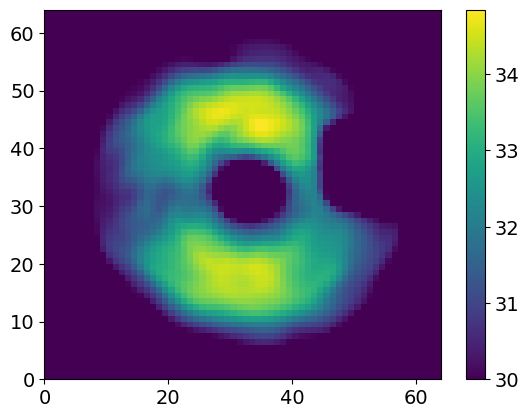

In [231]:
plt.pcolormesh(ims2, vmin = 30)
plt.colorbar()

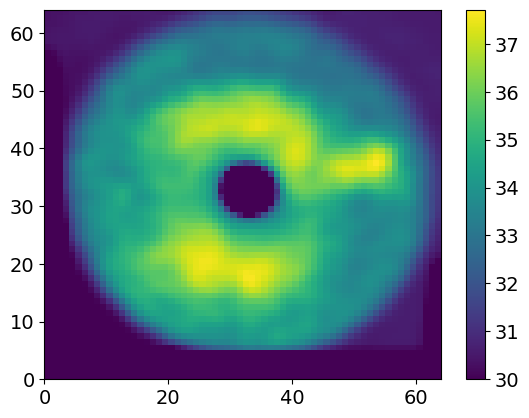

In [241]:
resid = np.mean(bg_im[idx_r],axis = 0)
qqs0 = np.array([0.98849101, 0.99340145, 0.99498136, 1.        ])
q0 = np.mean(bgdat['quads'][[0,1]],axis = 0)
resid = resid*rebin(rebin(cv2.warpPerspective(make_quads(1/qqs0),MM,(1024,1024)),4),4)
#resid = resid*rebin(rebin(cv2.warpPerspective(make_quads(1/qqs0*qqs0),MM,(1024,1024)),4),4)
resid = gf(resid, 0.5+5/16)
plt.pcolormesh(resid, vmin = 30)
plt.colorbar()

can you subtract mean from str - unstr


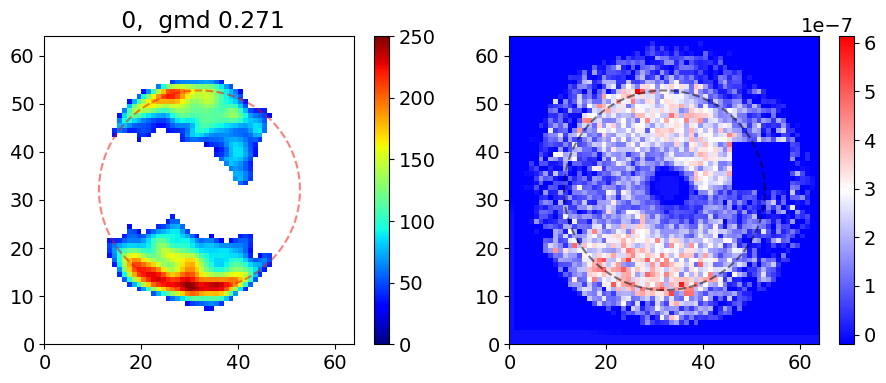

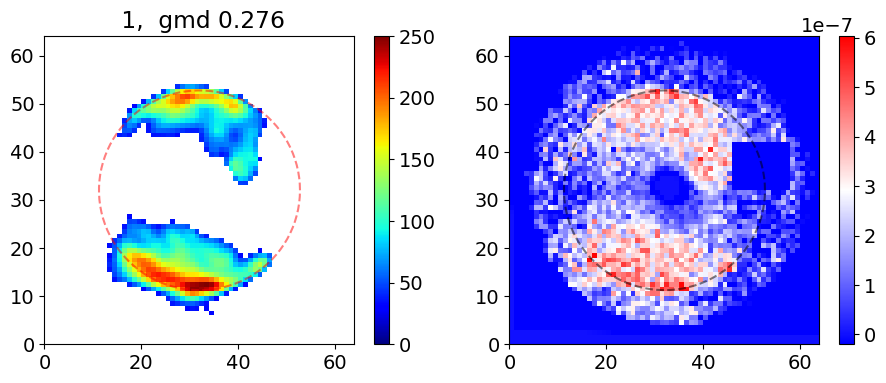

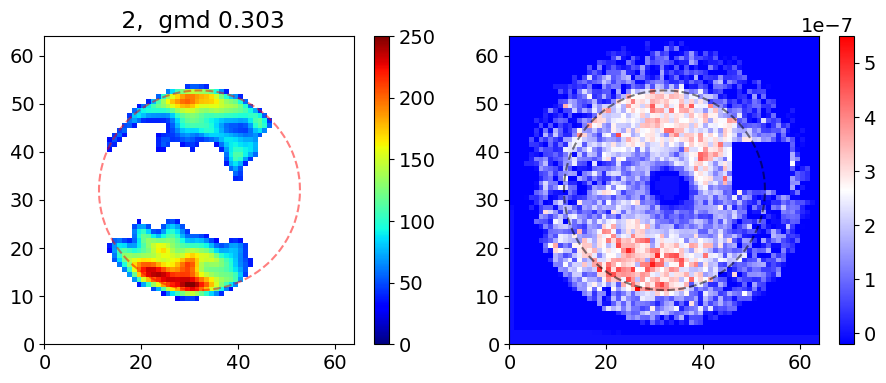

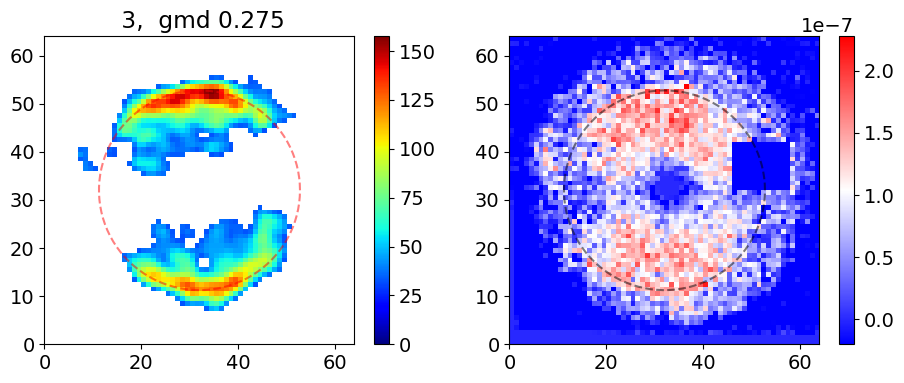

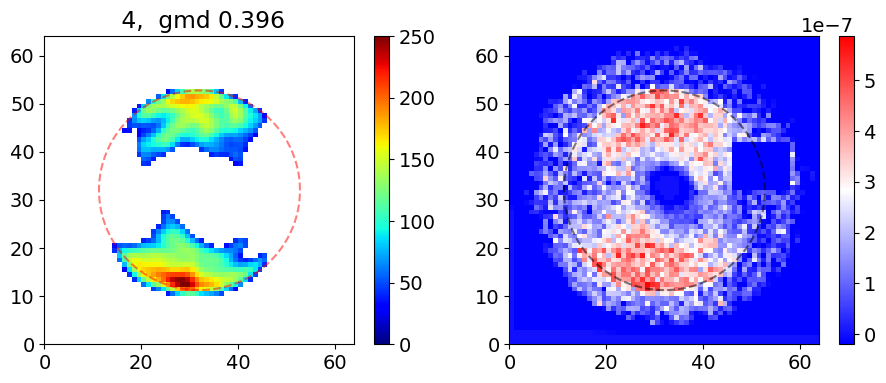

...

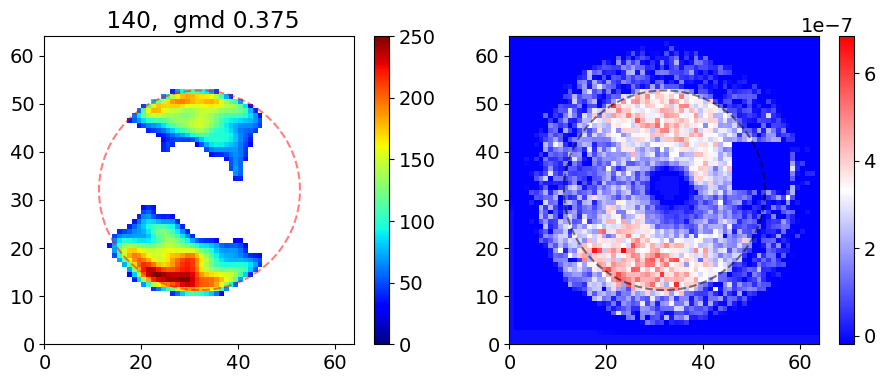

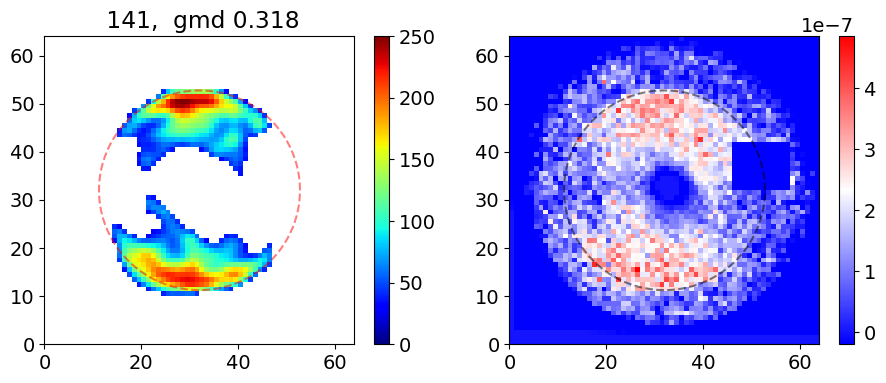

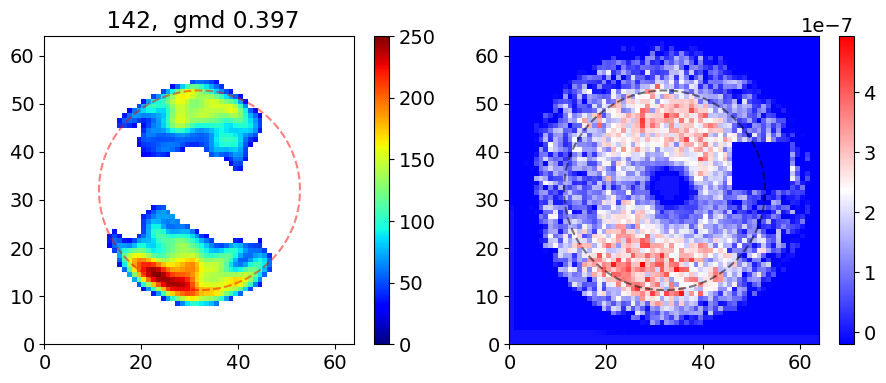

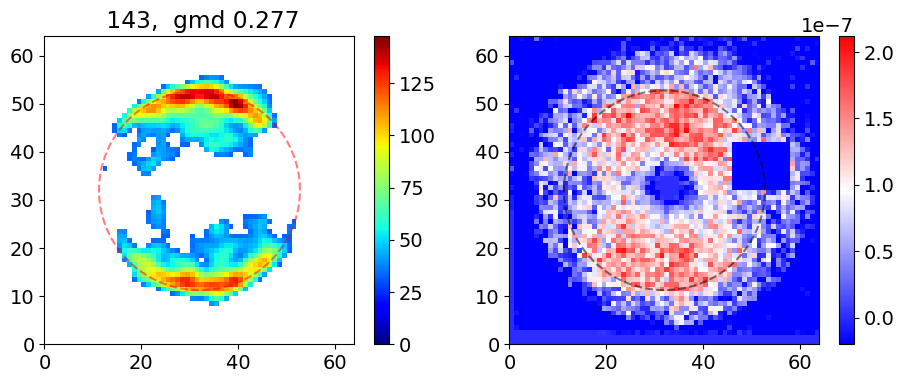

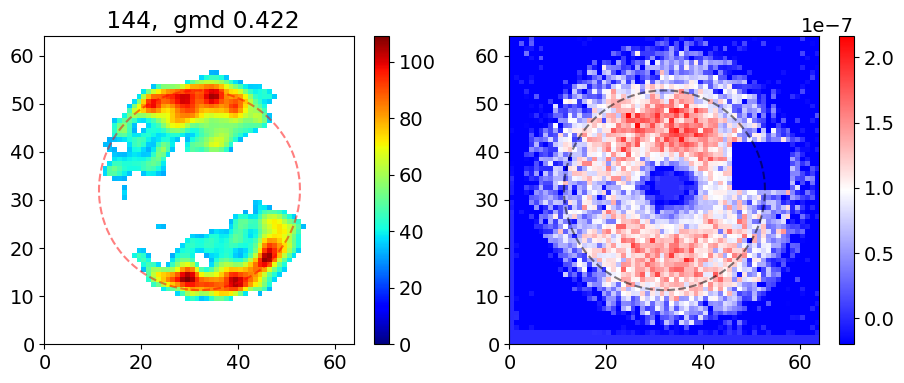

In [259]:
phi_rad = np.linspace(0,360,100)*np.pi/180
print('can you subtract mean from str - unstr')
for i in range(len(specs)):
    c = cVMIs[i]
    c[c<0] = 0
    cVMIs[i] = c
    fig,axs = plt.subplots(nrows = 1, ncols = 2, figsize = (11,4))
    p = axs[0].pcolormesh(c, cmap = my_cmap)
    axs[0].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar(p, ax = axs[0])
    axs[0].set_title(' %1.0f,  gmd %1.3f' %(i, gds[i]))
    # p = axs[1].pcolormesh(str_unstr[i], cmap = 'bwr')
    # axs[1].plot((512+332*np.cos(phi_rad))/1, (512+332*np.sin(phi_rad))/1, 'k--', alpha = 0.5)
    p = axs[1].pcolormesh(rebin(rebin(str_unstr[i],4),4), cmap = 'bwr', vmin=-0.2e-7)
    axs[1].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'k--', alpha = 0.5)
    plt.colorbar(p,ax = axs[1])
    plt.show()
    # fig,axs = plt.subplots(nrows = 1, ncols = 3, figsize = (15,4))
    # scc = 1 #np.max(cVMIsa[i]/np.sum(cVMIsa[i]))
    # p = axs[0].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[0])
    # p = axs[1].pcolormesh(cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[1])
    # p = axs[2].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc-cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[2])
    # plt.show()

In [261]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Aug21_131.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Aug21_131.npy', cVMIs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/GDs_Aug21_131.npy', gds)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/tmstmps_Aug21_131.npy', tmstmps)


In [263]:
tmstmps[-1]

4410507358282179268

In [262]:
np.max(tmstmps)

4410507358282179268

In [20]:
!ls /reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Aug17_131/

pytorchrecon_0_Up0.0_seed0.npy	pytorchrecon_0_Up0.5_seed1.npy
pytorchrecon_0_Up0.2_seed0.npy	pytorchrecon_0_Up0.5_seed2.npy
pytorchrecon_0_Up0.2_seed1.npy	pytorchrecon_0_Up0.7_seed0.npy
pytorchrecon_0_Up0.3_seed0.npy	pytorchrecon_0_Up0.7_seed1.npy
pytorchrecon_0_Up0.4_seed0.npy	pytorchrecon_0_Up0.9_seed0.npy
pytorchrecon_0_Up0.5_seed0.npy	pytorchrecon_0_Up0.9_seed1.npy


In [18]:
cVMIs = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Aug1_127.npy')

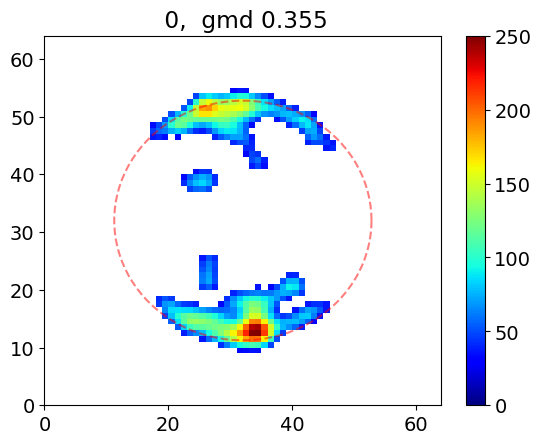

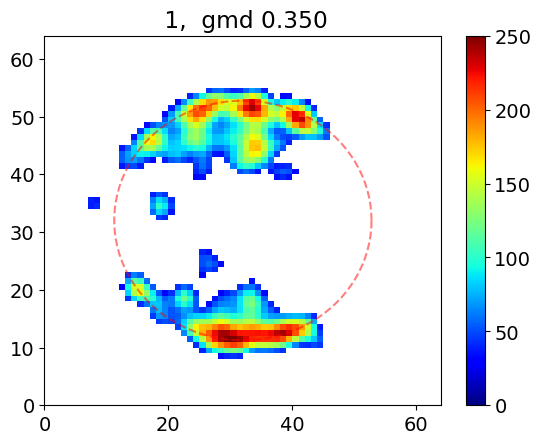

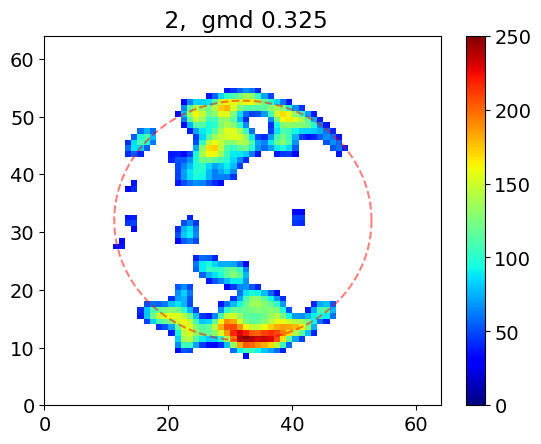

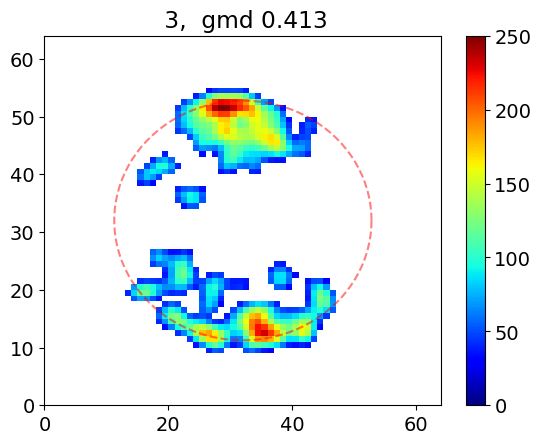

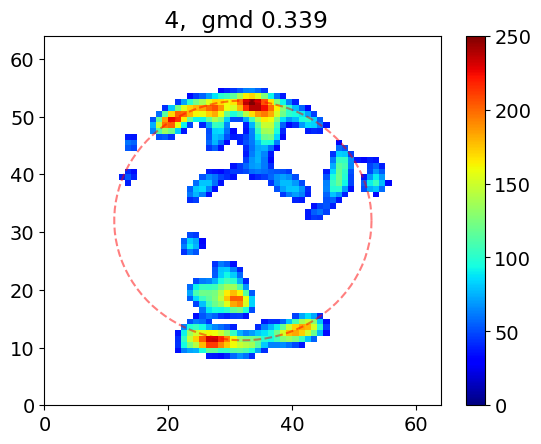

...

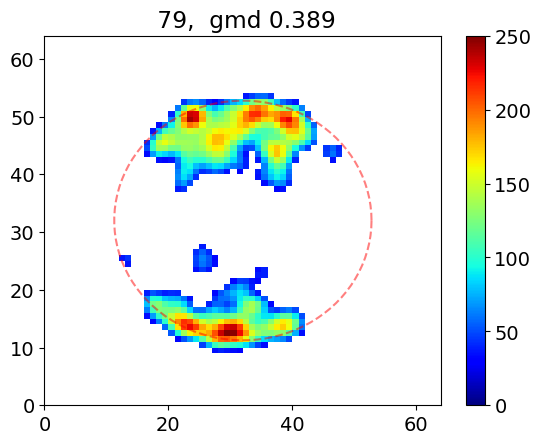

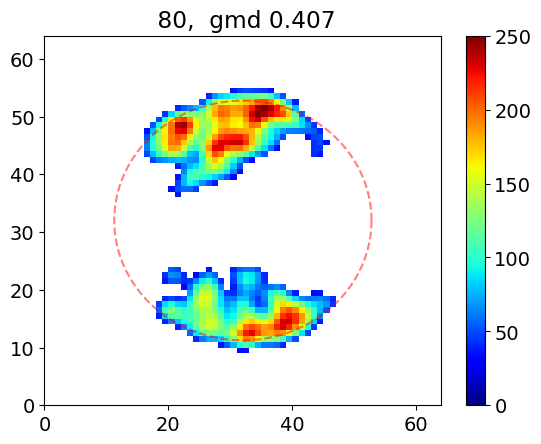

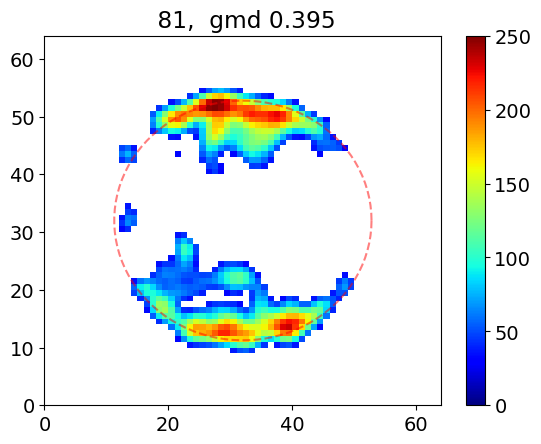

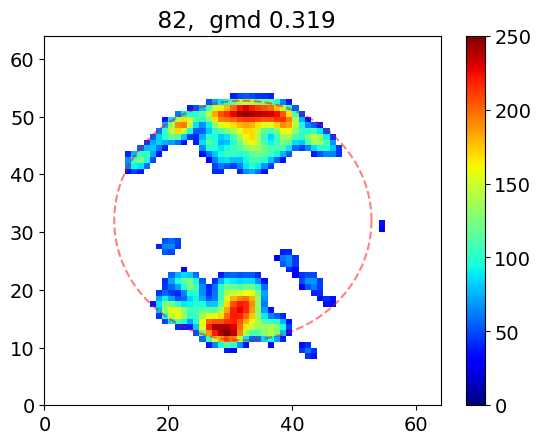

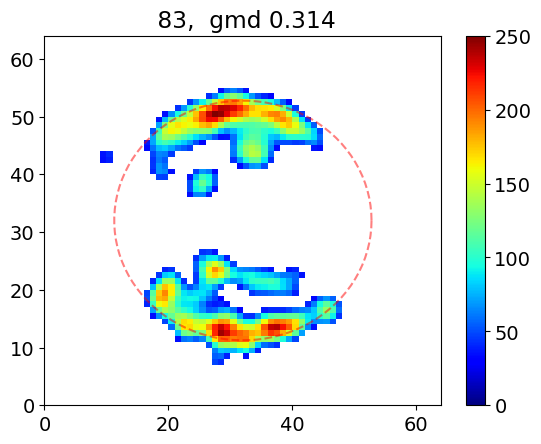

In [19]:
phi_rad = np.linspace(0,360,100)*np.pi/180

for i in range(len(specs)):
    c = cVMIs[i]
    c = gf(c,1)
    c = c*250/np.max(c)
    c[c<32] = 0
    plt.pcolormesh(c, cmap = my_cmap)
    plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar()
    plt.title(' %1.0f,  gmd %1.3f' %(i, gds[i]))
    plt.show()
    # fig,axs = plt.subplots(nrows = 1, ncols = 3, figsize = (15,4))
    # scc = 1 #np.max(cVMIsa[i]/np.sum(cVMIsa[i]))
    # p = axs[0].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[0])
    # p = axs[1].pcolormesh(cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[1])
    # p = axs[2].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc-cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[2])
    # plt.show()

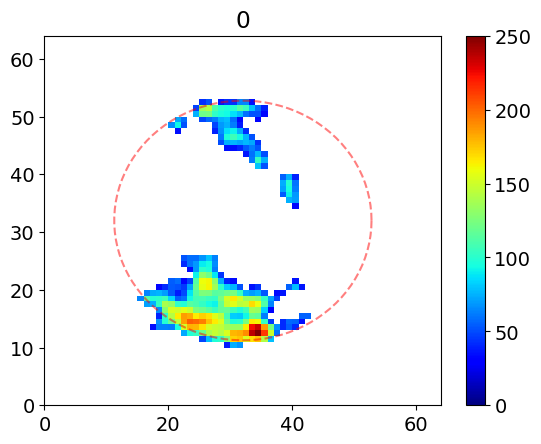

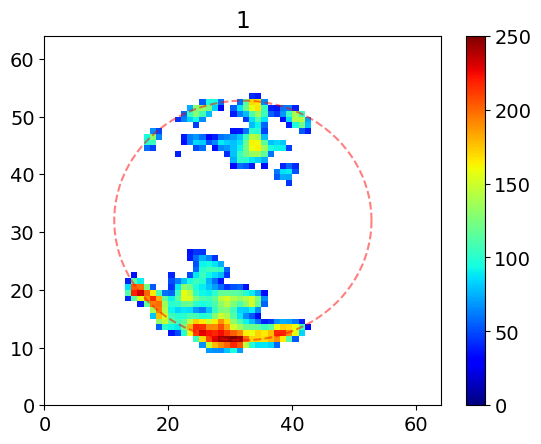

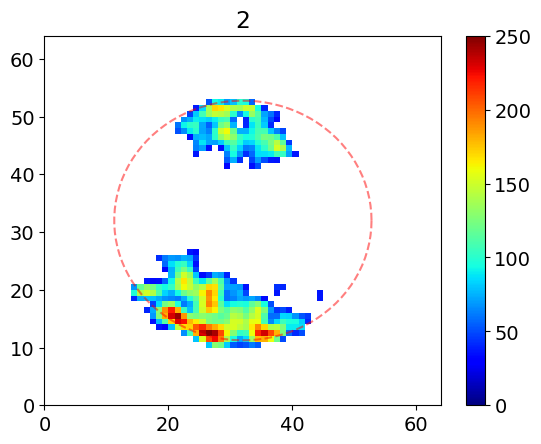

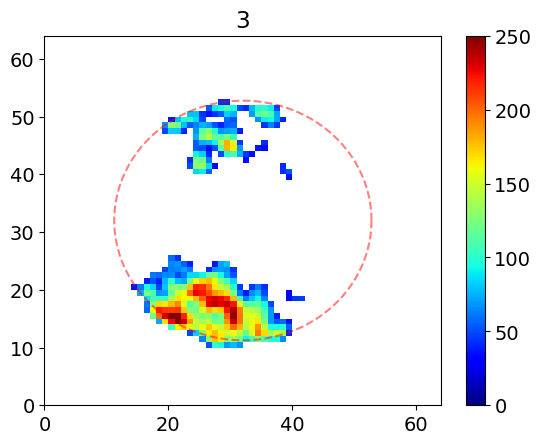

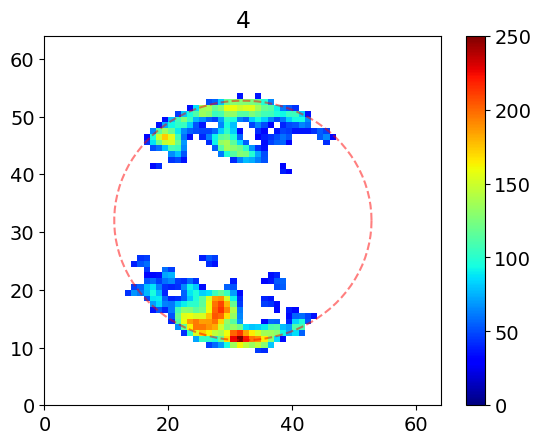

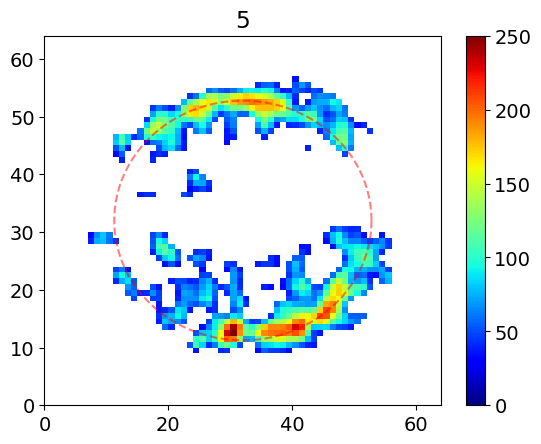

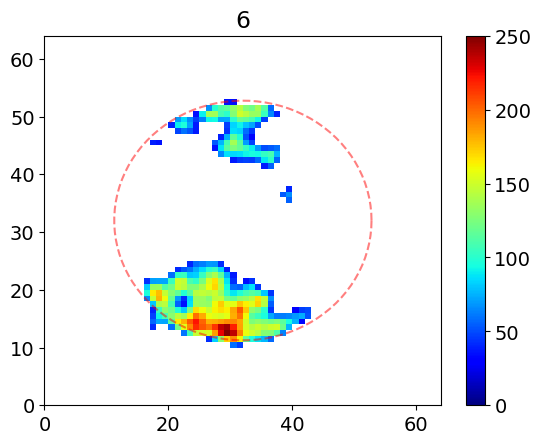

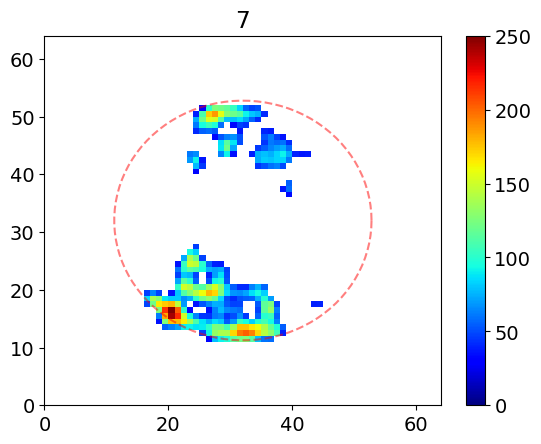

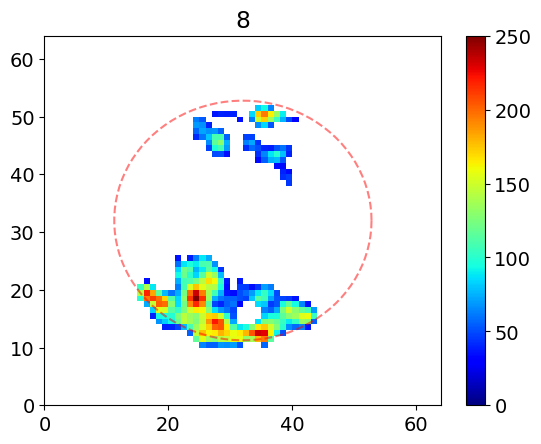

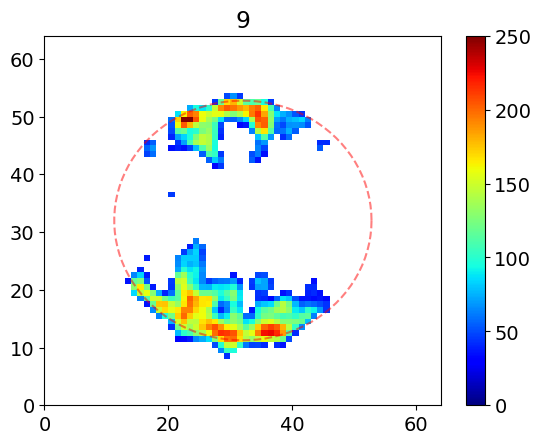

In [11]:
cVMIs2 = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Mar25_127.npy', allow_pickle = True)[()]
phi_rad = np.linspace(0,360,100)*np.pi/180

for i in range(10):
    c = cVMIs2[i]
    c[c<0] = 0
    plt.pcolormesh(c, cmap = my_cmap)
    plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar()
    plt.title(i)
    plt.show()

Text(0.5, 1.0, '5')

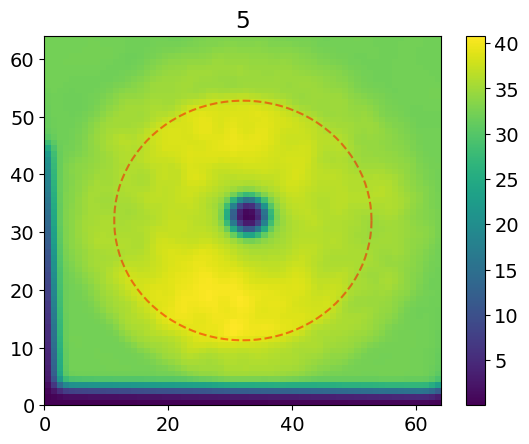

In [34]:
i = 5
plt.pcolormesh(unproc[i])
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title(i)

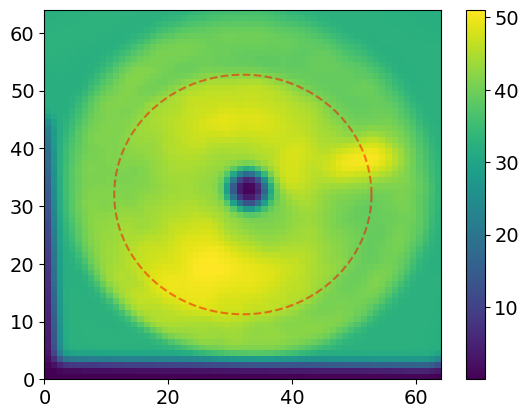

In [28]:
plt.pcolormesh(resid)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)

plt.colorbar()

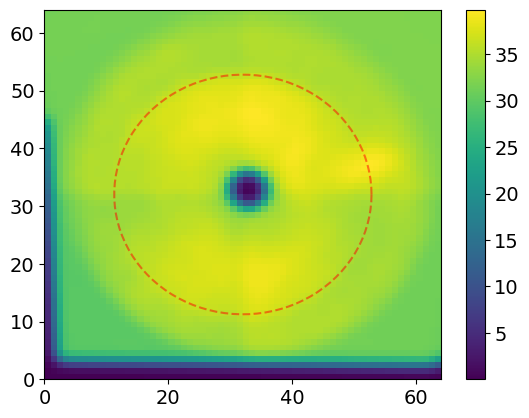

In [29]:
resid2= np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_127_Mar.npy')
plt.pcolormesh(resid2)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)

plt.colorbar()

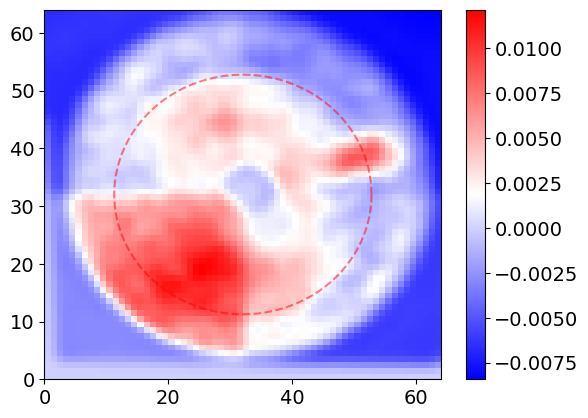

In [33]:
plt.pcolormesh((resid/np.sum(resid)-resid2/np.sum(resid2))*250, cmap = 'bwr')
plt.colorbar()
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)


In [15]:
len(cVMIs2)

115

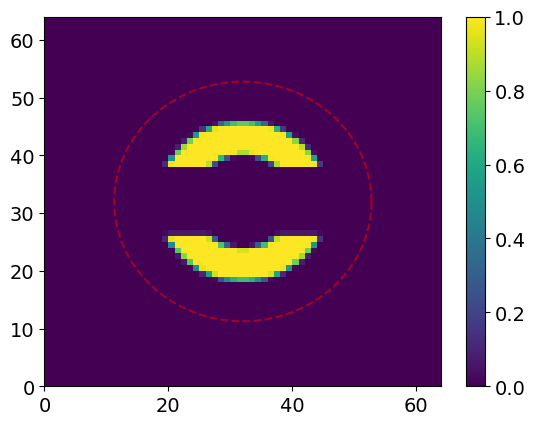

In [42]:
# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>100) & (rs<220)] = 1

testmask = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
testmask [(rs>130) & (rs<220)]=1
testmask [(Y>26*16) & (Y<38*16)]=0

# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>140) & (rs<220) & (X>28*16) &(X<36*16)]=1

# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# #testmask[(Y>26*16) & (Y<38*16) & (rs>80)]=1
# testmask[(Y>28*16) & (Y<36*16) & (rs>80)]=1
# testmask [(rs>390) & (rs<430)]=1


# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>390) & (rs<430)]=1

plt.pcolormesh(rebin(rebin(testmask,4),4))
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()


In [43]:
ims2 = np.copy(ims)
ims2 = mf(ims2, mfn)
ims2 = gf(ims2, gfn)
ims2= rebin(rebin(ims2,4),4)
unproc = ims2

#resid_scale = resid/np.mean(resid[24:36,22:27])*np.mean(ims2[24:36,22:27])
resid_scale = resid/np.mean(resid*rebin(rebin(testmask,4),4))*np.mean(ims2*rebin(rebin(testmask,4),4))
#residold_scale = residold/np.mean(residold*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
#ims2old = ims2 - residold_scale
ims2 = ims2 - resid_scale
ims2 = gf(ims2,.25)
#ims2old = gf(ims2old,.25)
#ims2 = rebin(ims2) #*inbg
ims2 = ims2*250/np.max(ims2)#*rebin(rebin(maskhm,4),4)



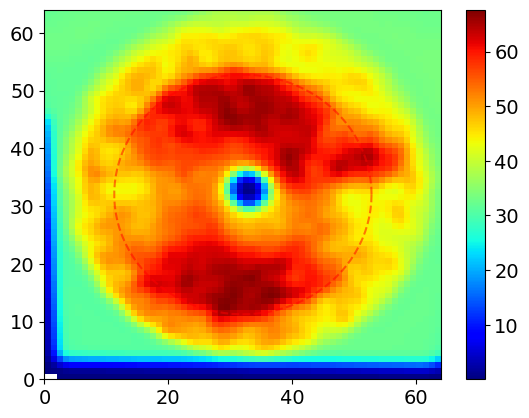

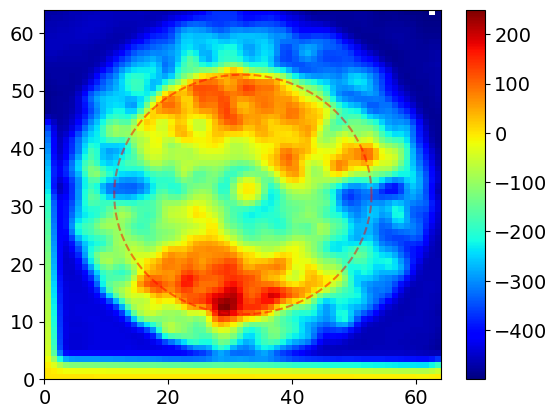

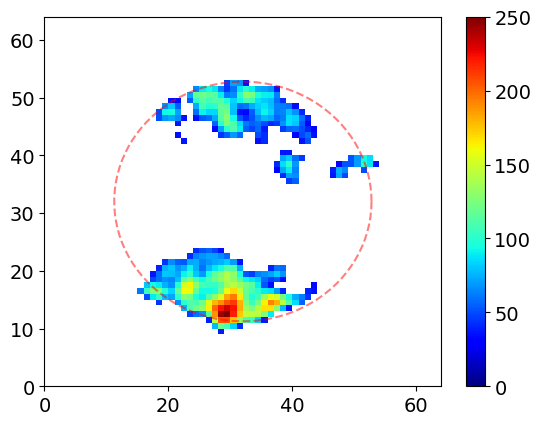

In [44]:
plt.pcolormesh(unproc, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()
plt.pcolormesh(ims2, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()
ims2[ims2<thresh] = 0
plt.pcolormesh(ims2*rebin(rebin(maskhm,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()

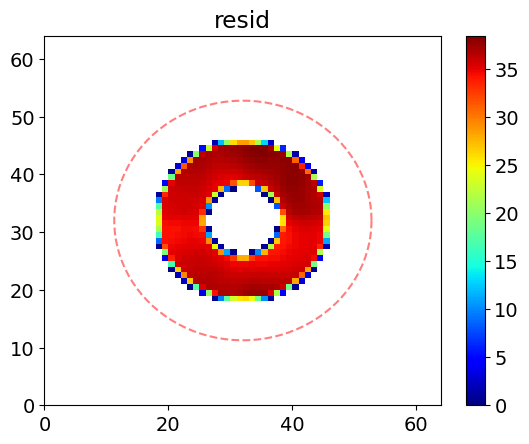

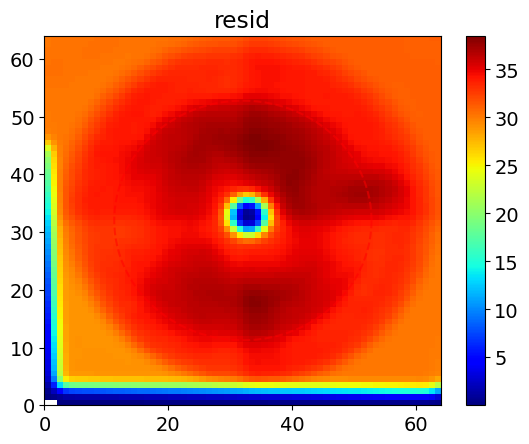

In [57]:
plt.pcolormesh(resid*rebin(rebin(testmask,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title('resid')
plt.show()


plt.pcolormesh(resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title('resid')
plt.show()

In [250]:
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>100) & (rs<220)]=1
#maskscale [(rs>120) & (rs<250)]=1



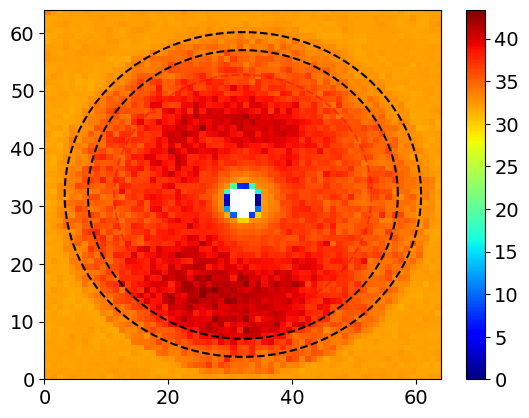

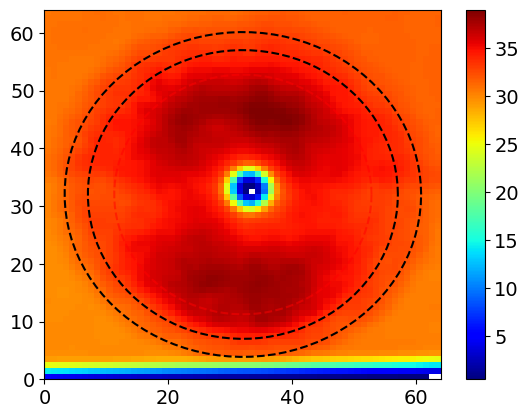

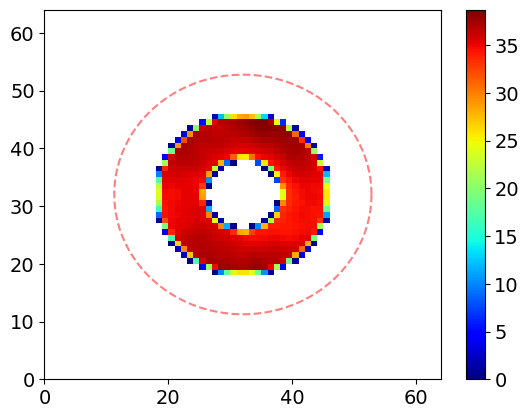

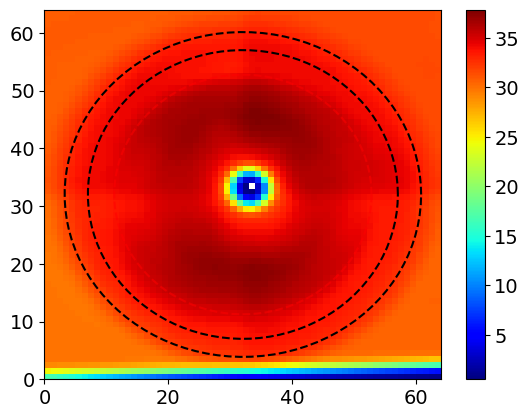

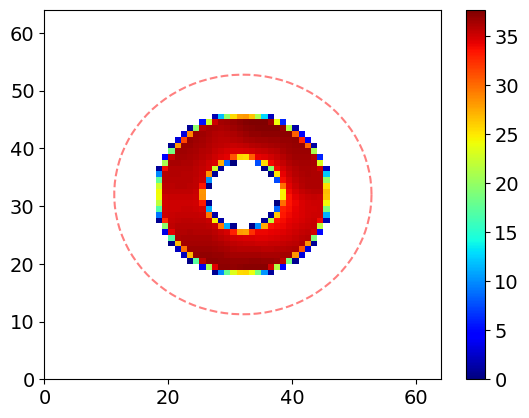

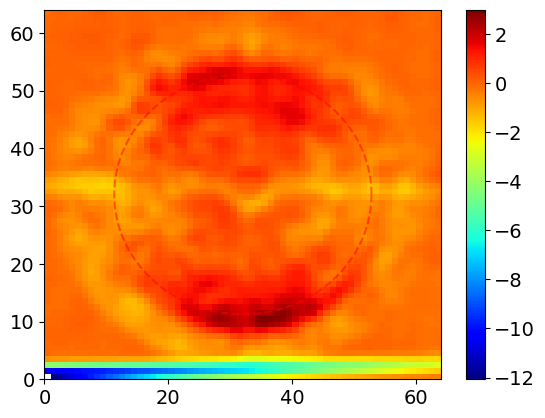

In [251]:
ims = np.rot90(im1*mask)
plt.pcolormesh(rebin(rebin(ims,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

gasoff = 0 #gasoff0/np.mean(gasoff0)*np.mean(ims)
ims = cv2.warpPerspective(ims-gasoff,MM,(1024,1024))*quads
ims[ims<0] = 0
ims2 = np.copy(ims)
ims2 = mf(ims2, mfn)
ims2 = gf(ims2, gfn)
ims2= rebin(rebin(ims2,4),4)
plt.pcolormesh(ims2, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

plt.pcolormesh(ims2*rebin(rebin(maskscale,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()

plt.pcolormesh(resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

plt.pcolormesh(resid*rebin(rebin(maskscale,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()



plt.pcolormesh(ims2 - resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()


In [248]:
# maskscale3 = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# maskscale3[(rs>400) & (rs<450)]=1



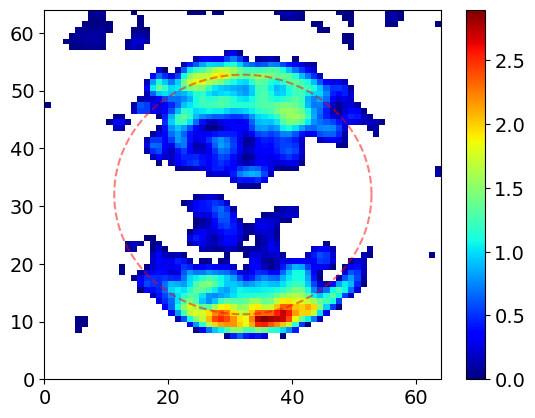

In [252]:
resid_scale = resid/np.mean(resid*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
ims2 = ims2 - resid_scale
ims2 = gf(ims2,.25)
ims2[ims2<0] = 0
phi_rad = np.linspace(0,360,100)*np.pi/180
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.pcolormesh(ims2, cmap = my_cmap)
plt.colorbar()
plt.show()

In [51]:
len(specs)

42

In [52]:
len(cVMIs)

42

In [53]:
len(tt)

42

(array([7., 4., 5., 7., 4., 3., 5., 4., 2., 1.]),
 array([0.15234375, 0.16209717, 0.17185059, 0.181604  , 0.19135742,
        0.20111084, 0.21086426, 0.22061768, 0.23037109, 0.24012451,
        0.24987793]),
 <BarContainer object of 10 artists>)

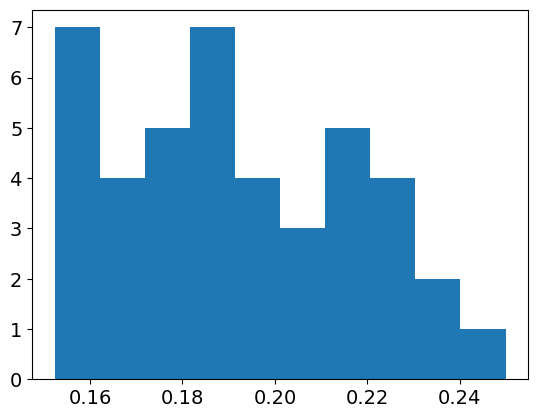

In [15]:
plt.hist(gds)

In [16]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/GDs_Jan19_110_2.npy', gds)

In [60]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan19_110_2.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan19_110_2.npy', cVMIs)

In [63]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan16_110.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan16_110.npy', cVMIs)

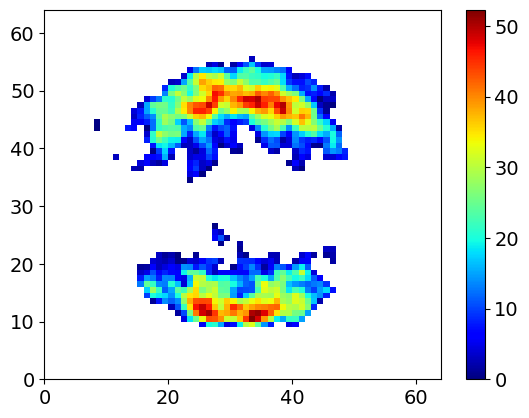

In [69]:
plt.pcolormesh(cVMIs[-10], cmap = my_cmap)
plt.colorbar()

In [9]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan11.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan11.npy', cVMIs)

In [48]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Dec16.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Dec16.npy', cVMIs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_nobg_Dec16.npy', unproc)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/ts_Dec16.npy', tt)

In [32]:
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_Nov5.npy', specs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_Nov5.npy', cVMIs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_oldresid_Nov5.npy', cVMIsold)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/ts_Nov5.npy', tt)

In [13]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_nobg_Nov5.npy', unproc)

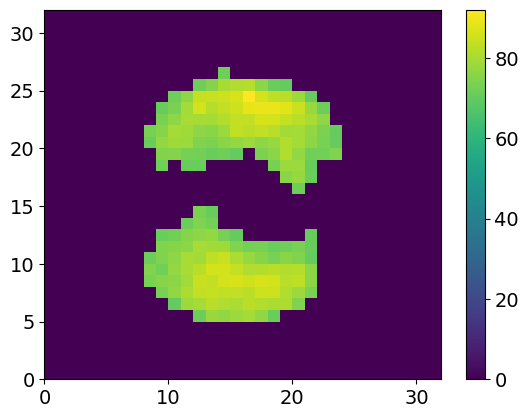

In [30]:
aa = rebin(unproc[0])
aa[ aa<70] = 0
plt.pcolormesh(aa)
plt.colorbar()

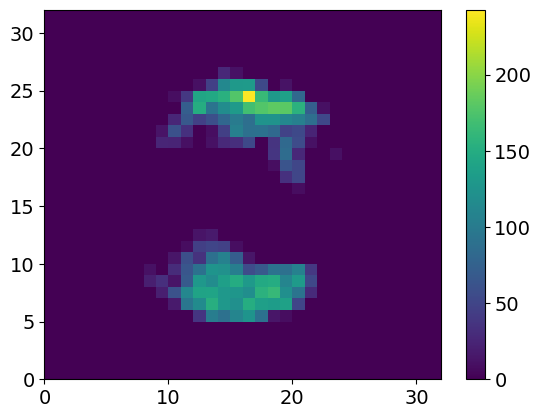

In [28]:
bb = rebin(cVMIs[0])
bb[bb<0] = 0
plt.pcolormesh(bb)
plt.colorbar()

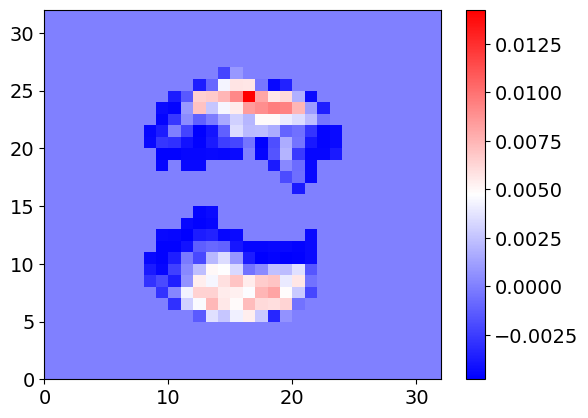

In [33]:
plt.pcolormesh(bb/np.sum(bb) - aa/np.sum(aa), cmap = 'bwr')
plt.colorbar()


/tmp/ipykernel_15835/1804110446.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(nrows = 1, ncols = 5, figsize = (16,3))


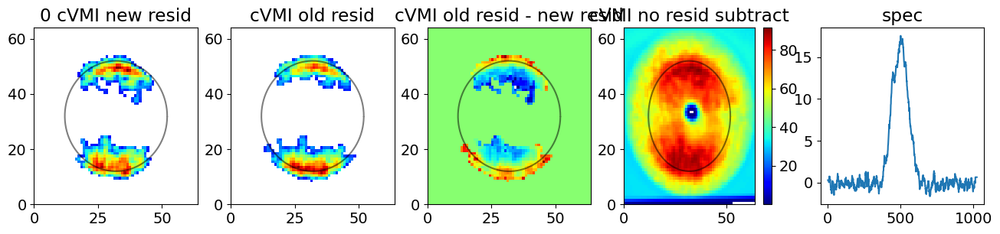

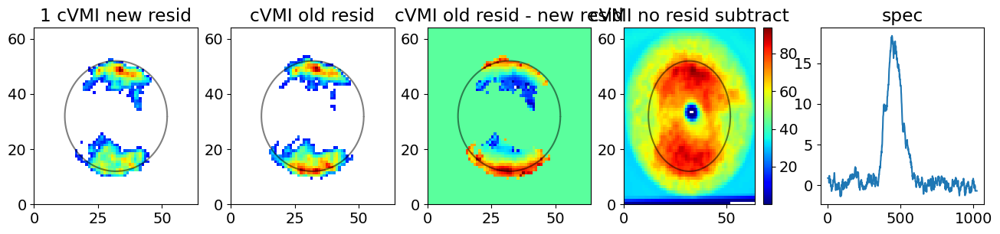

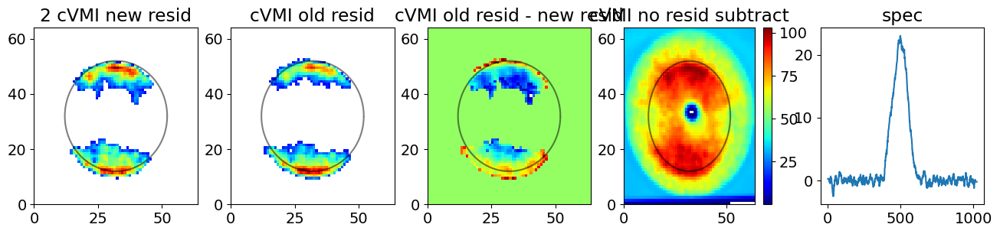

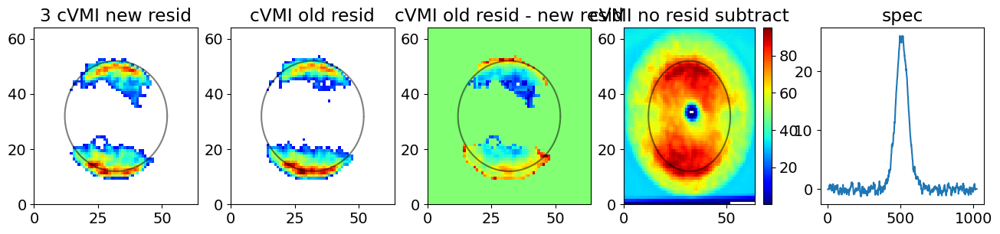

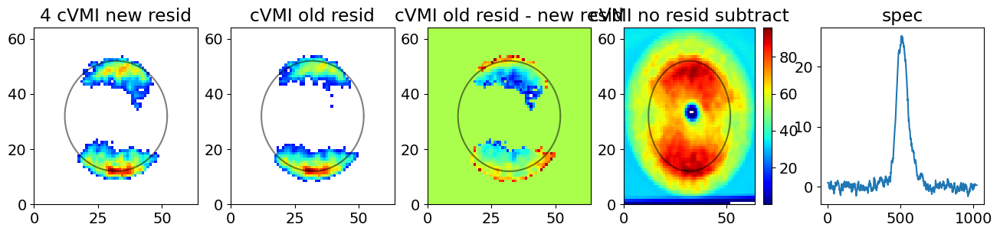

...

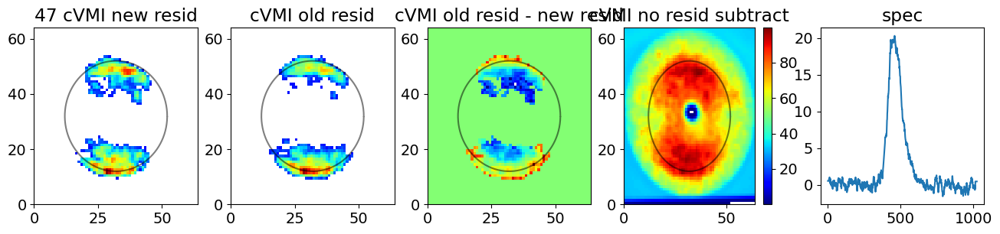

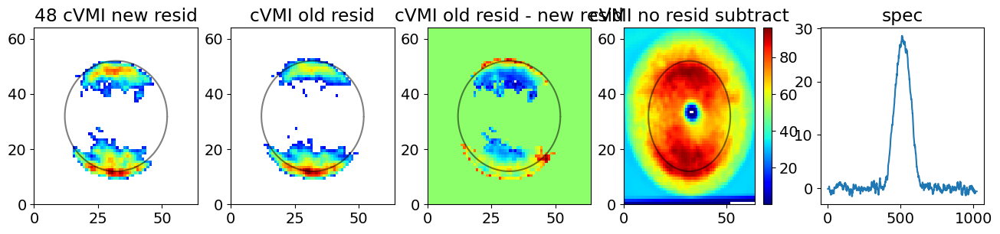

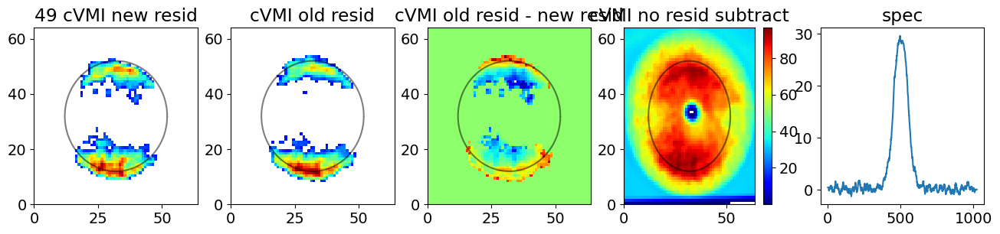

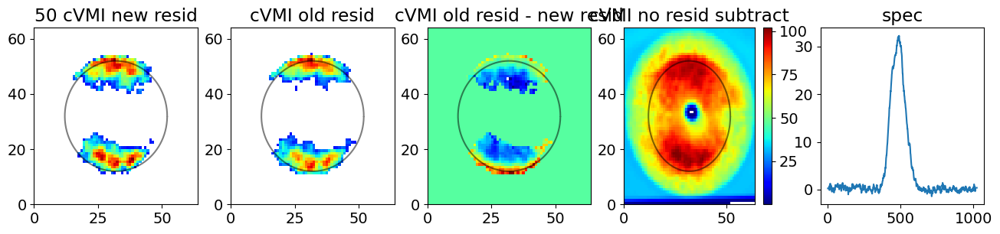

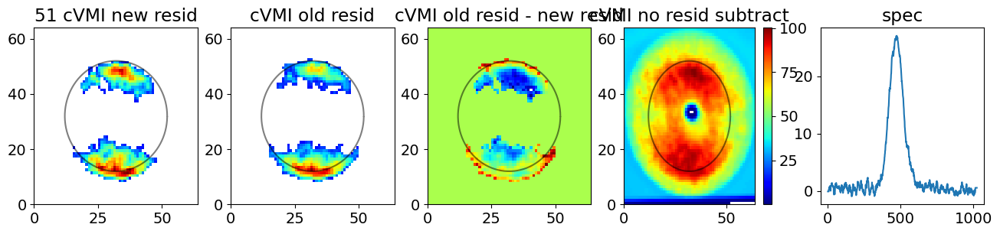

In [49]:
for i in range(len(tt)):
    fig,axs = plt.subplots(nrows = 1, ncols = 5, figsize = (16,3))
    axs[0].pcolormesh(cVMIs[i], cmap = my_cmap)
    axs[1].pcolormesh(cVMIsold[i], cmap = my_cmap)
    axs[2].pcolormesh(cVMIsold[i]-cVMIs[i], cmap = my_cmap)
    p =axs[3].pcolormesh(unproc[i], cmap = my_cmap)
    phis = np.linspace(0,359,100)*np.pi/180
    axs[0].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[1].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[2].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[3].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[4].plot(specs[i])
    axs[0].set_title('%1.0f cVMI new resid' %i)
    axs[1].set_title('cVMI old resid')
    axs[2].set_title('cVMI old resid - new resid')
    axs[3].set_title('cVMI no resid subtract')
    axs[4].set_title('spec')
    plt.colorbar(p, ax = axs[3])

In [9]:
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', specs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_testOct28.npy', cVMIs)


In [48]:
b = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()]

In [49]:
len(b)

17

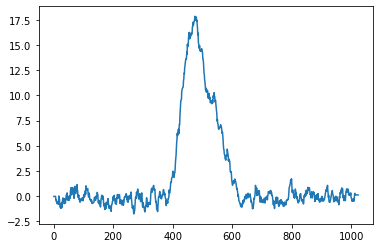

In [52]:
plt.plot(b[12])

In [97]:
tt[10]

4410467694582375735

In [105]:
tt = [4410467754356193385,4410467118580787210,4410467689813058340,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012] #[4410466500172553581]#[4410466517201035991] #[4410466517376017174] #[4410466521487221820] #[4410466500172553581] #[4410467694582375735] #[4410467436627939444]
tt= np.array(tt)
tt= tt[np.argsort(tt)]
tt[16]

4410467724635877132

In [106]:
ttnew = [4410467754356193385,4410467118580787210,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012,
      4410466482935666616, 4410466573846689349, 4410466594694478956, 4410466654584819656, 4410466684855376363, 4410466684972030485,4410466732255078812, 4410466753627943040, 4410466771014121067,
      4410466861457740912, 4410466865519007108, 4410466869746996948, 4410466925753018715, 4410466930289290010, 4410466981025037018]

ttnew= np.array(ttnew)
ttnew= ttnew[np.argsort(ttnew)]
np.where(np.array(ttnew) == 4410467724635877132)

(array([30]),)

In [99]:
ttnew[9]

4410467694582375735

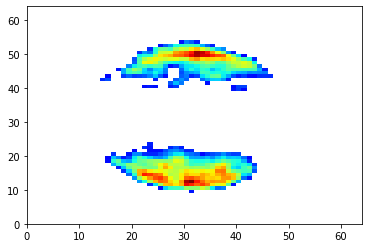

In [42]:
plt.pcolormesh(b, cmap = my_cmap)

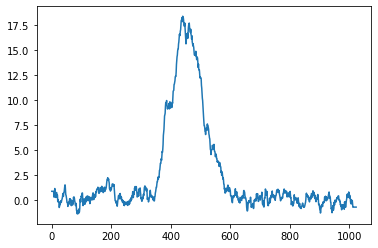

In [62]:
c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_Oct31.npy', allow_pickle = True)[()][0]
plt.plot(c)

In [24]:
np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_test.npy', allow_pickle = True)[()].shape

(17, 1024)

In [65]:
from scipy.interpolate import interp1d

In [70]:
Bps = []
alphas = []
vNaxiss = []

Np = 128
N_w=6
N_t=6 
energy_x = 54 #eV
hbar=6.6e-16 #eV*s
Nb=N_t*N_w
basesdir = '/reg/d/psdm/tmo/tmox51020/results/paris/circularpol_vNbases_dipole_K5/'

Up = 0.7  
filename = 'Bpbasis_Np' + str(Np) + '_Nw' + str(N_w) +'_Nt' + str(N_t) + '_Up' + str(Up)+'.npy'
br = np.load(basesdir+filename, allow_pickle=True)
Breal = br[()]['Breal']
Bimag = br[()]['Bimag']
breal = br[()]['breal']
bimag = br[()]['bimag']
vNaxis = br[()]['vNaxis']
alpha = br[()]['alpha']
Bp_basis = Breal+1j*Bimag

In [71]:
N = 2801
xf = np.arange(-N/2,N/2,1)/((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0])) #using tsample range
eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 

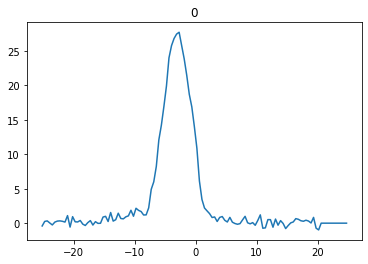

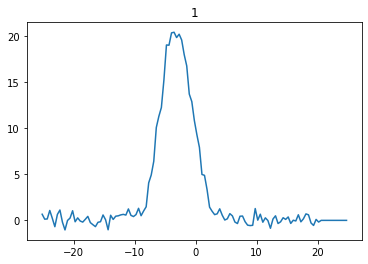

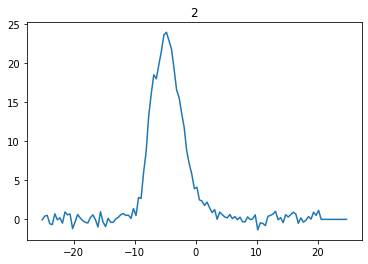

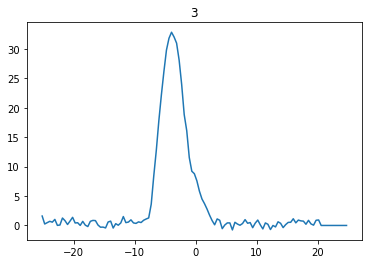

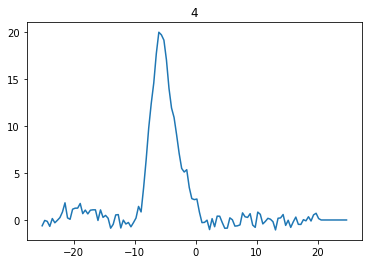

...

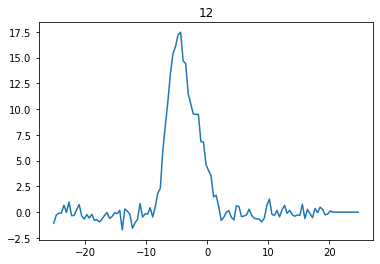

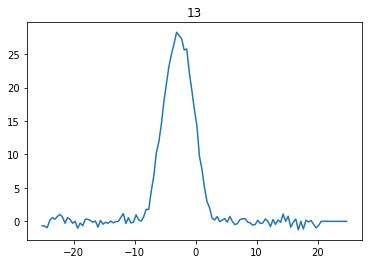

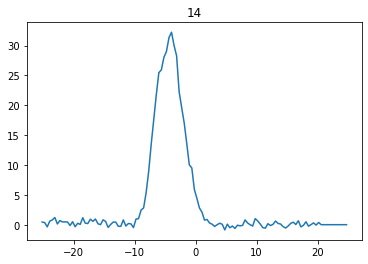

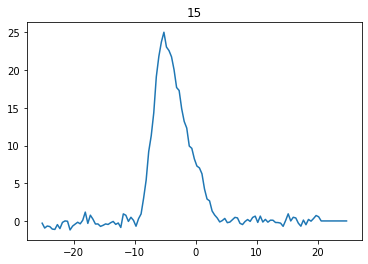

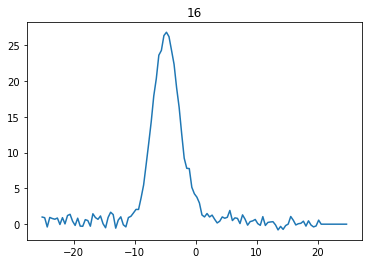

In [93]:
for i in range(17):
    fig,axs = plt.subplots()
    c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()][i]
    eshift = 2.9
    xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
    xeV = xeV - eshift #2.5 #3 #know this from previous calibration
    f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
    spec_in = f(eV[1340:-1340])
    #plt.plot(eV[1340:-1340], spec_in, ':')
    plt.plot(eV[1340:-1340], spec_in)
    plt.title(i)
    

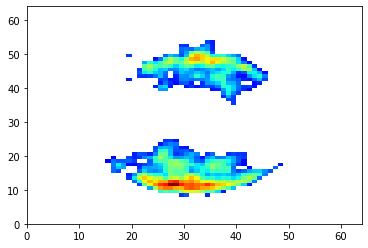

In [94]:
m = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_testOct28.npy', allow_pickle = True)[()][10]
plt.pcolormesh(m, cmap = my_cmap)
   

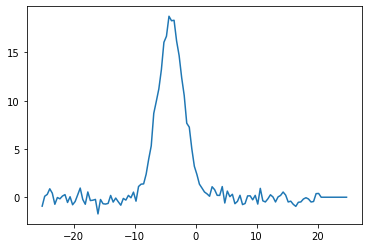

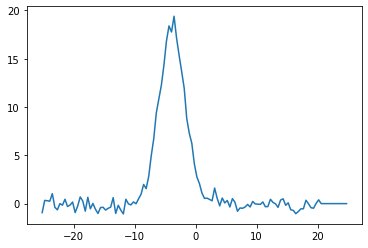

In [96]:
c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()][10]
eshift = 2.9
xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
xeV = xeV - eshift #2.5 #3 #know this from previous calibration
f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
spec_in = f(eV[1340:-1340])
plt.plot(eV[1340:-1340], spec_in)
eshift = 2.7
xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
xeV = xeV - eshift #2.5 #3 #know this from previous calibration
f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
spec_in = f(eV[1340:-1340])
#plt.plot(eV[1340:-1340], spec_in, ':')
fig,axs = plt.subplots()
plt.plot(eV[1340:-1340], spec_in)

In [6]:
! cp torchrecon_funcs.py /reg/d/psdm/tmo/tmox51020/results/paris/recon

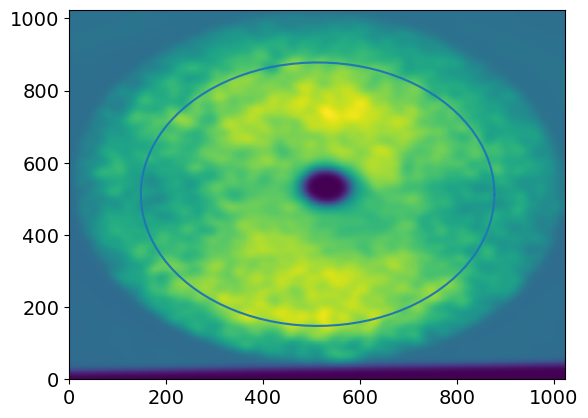

In [45]:
plt.pcolormesh(iiii)
phis = np.linspace(0,360,100)*np.pi/180
plt.plot(512+5.6*np.cos(347)+365*np.cos(phis), 512+5.6*np.cos(347)+365*np.sin(phis),)

In [42]:
R_vs_phi_1st, phi_1st = center_optimization_1st_polar(iiii, [512,512])
fit = lstSqFit(circpol, phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True) # phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True)

In [43]:
fit

(array([  5.60305325, 365.42739272, 347.05100458]), 19114.872376537853)

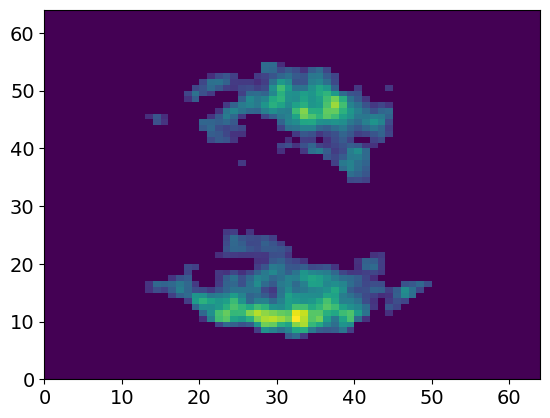

In [13]:
mdat = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Dec16.npy')
plt.pcolormesh(mdat[16])

In [24]:
R_vs_phi_1st, phi_1st = center_optimization_1st_polar(gf(cv2.resize(mdat[16], (1024,1024), interpolation = cv2.INTER_AREA),7), [512,512])
fit = lstSqFit(circpol, phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True) # phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True)

In [25]:
fit

(array([ 17.53019695, 336.63918593, 228.24245851]), 35502.88634779221)

In [27]:
17.5/16

1.09375

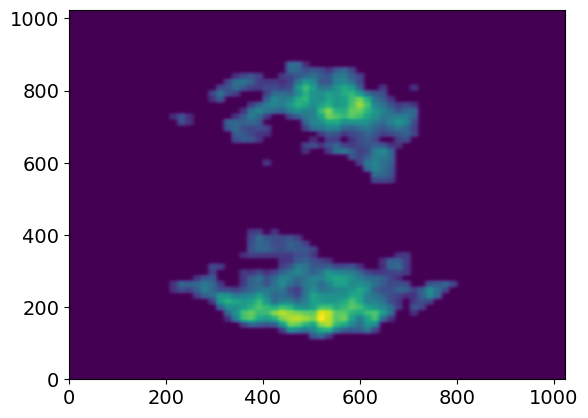

In [29]:
plt.pcolormesh(gf(cv2.resize(mdat[16], (1024,1024), interpolation = cv2.INTER_AREA),4))